<a href="https://colab.research.google.com/github/plaban1981/Timeseries/blob/master/Handling_missing_values_in_timeseries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


In time series typically handling missing data is not as straight forward as traditional ML algorithm. Apart from knowledge of data and domain there are multiple factors that come into play like seasonality, trend etc


Timeseries - Data points ordered in time

Assumption is that past pattern will continue is near future

In [1]:
!pip install download

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import os

from datetime import datetime
from download import download


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
path = download('https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip',path='/content',kind='zip',replace=True)


file_sizes: 100%|██████████████████████████| 7.96M/7.96M [00:01<00:00, 6.10MB/s]
Extracting zip file...
Successfully downloaded / unzipped to /content


In [4]:
path

'/content'

In [5]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (11,8)
mpl.rcParams['axes.grid'] = False

In [6]:
!ls -alrt /content/PRSA_Data_20130301-20170228

total 31780
drwxr-xr-x 1 root root    4096 Aug 12 04:51 ..
-rw-r--r-- 1 root root 2835916 Aug 12 04:51 PRSA_Data_Aotizhongxin_20130301-20170228.csv
-rw-r--r-- 1 root root 2722295 Aug 12 04:51 PRSA_Data_Changping_20130301-20170228.csv
-rw-r--r-- 1 root root 2675856 Aug 12 04:51 PRSA_Data_Dingling_20130301-20170228.csv
-rw-r--r-- 1 root root 2636684 Aug 12 04:51 PRSA_Data_Dongsi_20130301-20170228.csv
-rw-r--r-- 1 root root 2695860 Aug 12 04:51 PRSA_Data_Guanyuan_20130301-20170228.csv
-rw-r--r-- 1 root root 2654625 Aug 12 04:51 PRSA_Data_Gucheng_20130301-20170228.csv
-rw-r--r-- 1 root root 2641027 Aug 12 04:51 PRSA_Data_Huairou_20130301-20170228.csv
-rw-r--r-- 1 root root 2839705 Aug 12 04:51 PRSA_Data_Nongzhanguan_20130301-20170228.csv
-rw-r--r-- 1 root root 2620654 Aug 12 04:51 PRSA_Data_Shunyi_20130301-20170228.csv
-rw-r--r-- 1 root root 2655061 Aug 12 04:51 PRSA_Data_Tiantan_20130301-20170228.csv
-rw-r--r-- 1 root root 2659544 Aug 12 04:51 PRSA_Data_Wanliu_20130301-20170228.csv
drwxr-

In [7]:
def convert_to_date(x):
  return datetime.strptime(x,'%Y %m %d %H')

In [8]:
aq_df = pd.read_csv('/content/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv',parse_dates=[['year','month','day','hour']],date_parser=convert_to_date)

In [9]:
aq_df.head()

,year_month_day_hour,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [10]:
aq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   No                   35064 non-null  int64         
 2   PM2.5                34285 non-null  float64       
 3   PM10                 34408 non-null  float64       
 4   SO2                  34334 non-null  float64       
 5   NO2                  33830 non-null  float64       
 6   CO                   33052 non-null  float64       
 7   O3                   33850 non-null  float64       
 8   TEMP                 35011 non-null  float64       
 9   PRES                 35014 non-null  float64       
 10  DEWP                 35011 non-null  float64       
 11  RAIN                 35013 non-null  float64       
 12  wd                   34924 non-null  object        
 13  WSPM                 35021 non-

## Checking for null values

In [11]:
aq_df.isnull().sum()[aq_df.isnull().sum() > 0]

PM2.5     779
PM10      656
SO2       730
NO2      1234
CO       2012
O3       1214
TEMP       53
PRES       50
DEWP       53
RAIN       51
wd        140
WSPM       43
dtype: int64

In [ ]:
aq_df.query('TEMP != TEMP').count() # null not equal to null,other columns null when temperature is null

year_month_day_hour    53
No                     53
PM2.5                  53
PM10                   53
SO2                    53
NO2                    53
CO                     53
O3                     53
TEMP                    0
PRES                    3
DEWP                    0
RAIN                    3
wd                     10
WSPM                   10
station                53
dtype: int64

In [12]:
aq_df[aq_df['PM2.5'].isnull()]

,year_month_day_hour,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
752,2013-04-01 08:00:00,753,NaN,NaN,NaN,NaN,NaN,NaN,11.0,1005.9,-3.2,0.0,NW,7.2,Dingling
753,2013-04-01 09:00:00,754,NaN,NaN,NaN,NaN,NaN,NaN,10.6,1007.0,-3.5,0.0,NNW,4.5,Dingling
754,2013-04-01 10:00:00,755,NaN,NaN,NaN,NaN,NaN,NaN,13.2,1007.8,-3.6,0.0,NNW,4.5,Dingling
755,2013-04-01 11:00:00,756,NaN,NaN,NaN,NaN,NaN,NaN,13.8,1007.7,-4.9,0.0,NNE,4.0,Dingling
756,2013-04-01 12:00:00,757,NaN,NaN,NaN,NaN,NaN,NaN,15.3,1007.9,-5.7,0.0,NE,5.0,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34863,2017-02-20 15:00:00,34864,NaN,NaN,NaN,NaN,NaN,NaN,4.2,1022.0,-21.0,0.0,WNW,3.1,Dingling
34864,2017-02-20 16:00:00,34865,NaN,NaN,NaN,NaN,NaN,NaN,4.4,1022.1,-21.7,0.0,WNW,3.4,Dingling
34866,2017-02-20 18:00:00,34867,NaN,NaN,NaN,NaN,NaN,NaN,3.3,1022.2,-20.9,0.0,NE,1.1,Dingling
34883,2017-02-21 11:00:00,34884,NaN,NaN,26.0,68.0,NaN,5.0,-0.5,1022.7,-16.0,0.0,ESE,1.9,Dingling


In [ ]:
!pip install -U kaleido

Requirement already up-to-date: kaleido in /usr/local/lib/python3.6/dist-packages (0.0.2)


In [13]:
import plotly.express as px
def time_plot(df,x,y):
  fig = px.line(df,x=x,y=y,title= y+'with slider')
  fig.update_xaxes(rangeslider_visible=True,rangeselector=dict(buttons=list([
                      dict(count=1,label='1y',step="year",stepmode="backward"),
                      dict(count=2,label="2y",step="year",stepmode="backward"),
                      dict(count=3,label="3y",step="year",stepmode="backward"),
                      dict(count=4,label="4y",step="year",stepmode="backward"),
                      dict(step='all')
                     ])
              )
  )
  fig.show()

In [14]:
time_plot(aq_df,'year_month_day_hour','PM2.5')

In [15]:
time_plot(aq_df,'year_month_day_hour','TEMP')

## Create index
It is a good way to analyze time series information

In [19]:
aq_df = aq_df.set_index('year_month_day_hour')

In [23]:
aq_df.loc['2015-02-02':'2015-04-02']

,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,
2015-02-02 00:00:00,16873,67.0,67.0,32.0,40.0,2600.0,11.0,-4.0,1025.0,-19.5,0.0,NW,1.3,Dingling
2015-02-02 01:00:00,16874,60.0,60.0,30.0,39.0,2600.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-02 02:00:00,16875,65.0,65.0,17.0,46.0,2600.0,3.0,-6.0,1023.0,-19.7,0.0,NNW,0.1,Dingling
2015-02-02 03:00:00,16876,75.0,75.0,18.0,50.0,2900.0,3.0,-6.0,1023.0,-19.4,0.0,NNW,2.3,Dingling
2015-02-02 04:00:00,16877,96.0,96.0,19.0,53.0,3600.0,2.0,-6.0,1023.0,-19.0,0.0,NW,1.5,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-02 19:00:00,18308,24.0,14.5,10.0,14.0,600.0,99.0,13.6,990.6,1.9,0.0,WNW,5.0,Dingling
2015-04-02 20:00:00,18309,20.0,9.0,11.0,14.0,600.0,101.0,13.7,991.8,1.0,0.0,WNW,5.9,Dingling
2015-04-02 21:00:00,18310,9.0,9.0,8.0,10.0,400.0,118.0,13.3,993.5,1.3,0.0,W,4.0,Dingling


# Drop null values to visualize autocorelation

autocorelation --> corelation within itself i.e. how a feature is correlated to the time span in the last month/week/day before

corelation - comapring one variable against another

In [24]:
aq_df_na = aq_df.copy()
aq_df_na = aq_df_na.dropna()

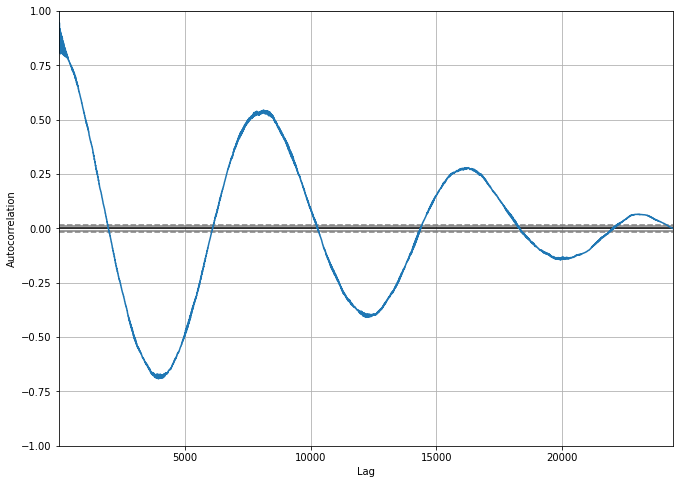

In [26]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['TEMP'])

Aggregate the data using mean and sample it on a monthly basis instead of hourly basis as in the above plot

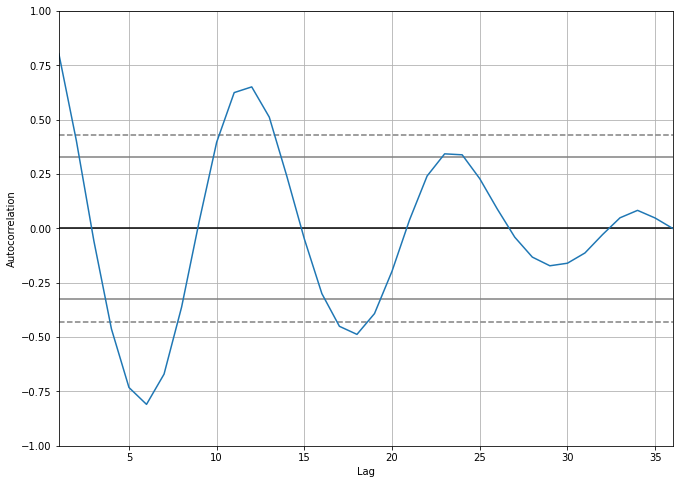

In [28]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['TEMP'].resample('1m').mean())

in the 12th month we can see a peakfollowed by another peak at 24th month, so there is a seasonality or auto corelation every year.

# Lag Plot - corelation ,between temperature now and one hour back

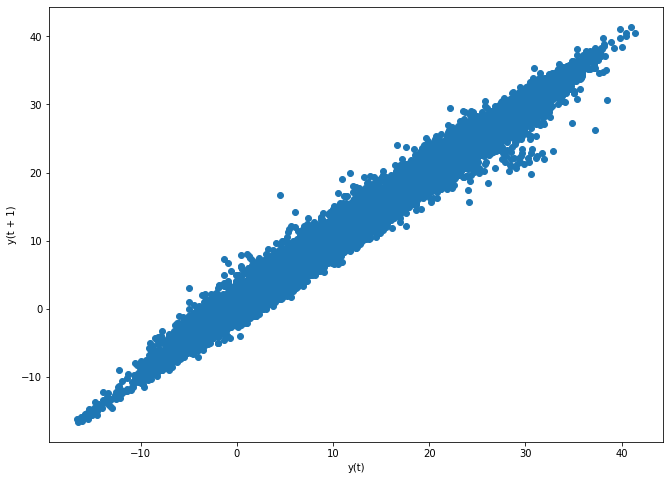

In [30]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=1)

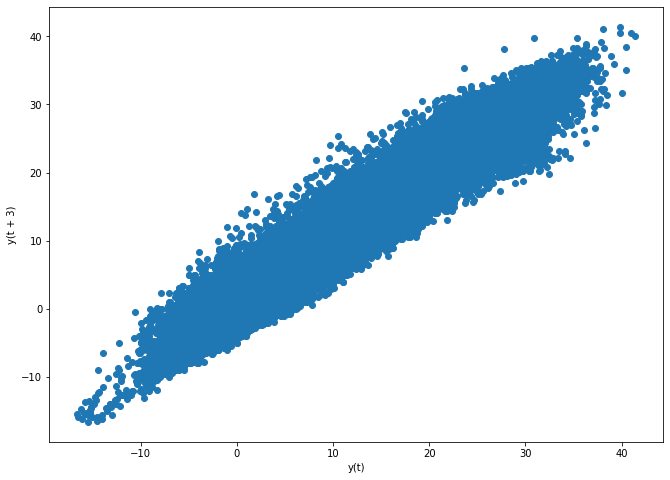

In [31]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=3)

Although Linear relationship, points are not that close

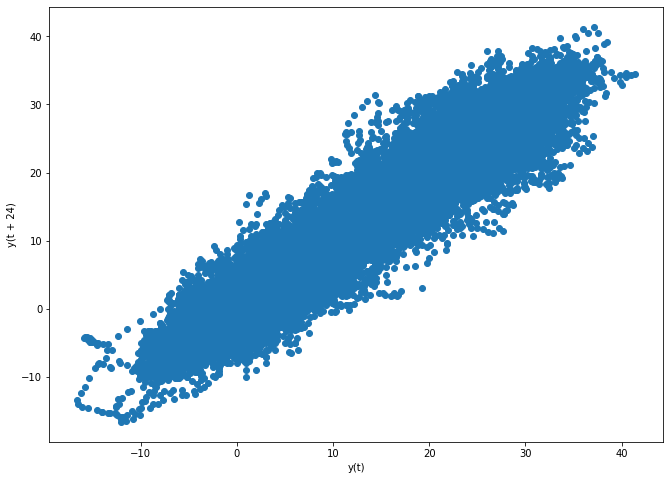

In [32]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=24)

# Check the lag for last year 24 hours * 365 Days

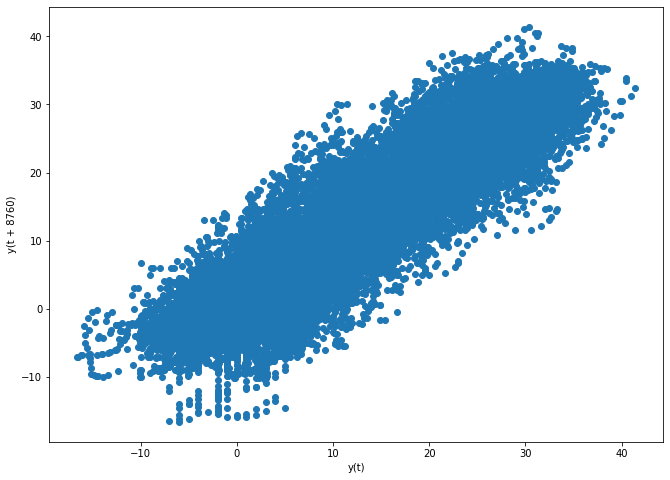

In [33]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=24 * 365)

There is still linearity but it is not as strong as lag1 / lag3 / lag24

In [37]:
aq_df.loc['2015-02-21 10':'2015-02-21 23']['TEMP']

year_month_day_hour
2015-02-21 10:00:00    1.0
2015-02-21 11:00:00    1.0
2015-02-21 12:00:00    NaN
2015-02-21 13:00:00    2.0
2015-02-21 14:00:00    NaN
2015-02-21 15:00:00    4.0
2015-02-21 16:00:00    4.0
2015-02-21 17:00:00    3.0
2015-02-21 18:00:00    2.0
2015-02-21 19:00:00    1.0
2015-02-21 20:00:00    NaN
2015-02-21 21:00:00   -1.0
2015-02-21 22:00:00   -1.0
2015-02-21 23:00:00   -2.0
Name: TEMP, dtype: float64

In [47]:
aq_df_imputation = aq_df.loc['2015-02-21 10':'2015-02-21 23'].copy()

# Method 1: Forward Fill

In [48]:
aq_df_imputation['TEMP_FFIL'] = aq_df_imputation['TEMP'].fillna(method='ffill')

In [51]:
aq_df_imputation

,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFIL
year_month_day_hour,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0
2015-02-21 11:00:00,17340,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0
2015-02-21 12:00:00,17341,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,1.0
2015-02-21 13:00:00,17342,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0
2015-02-21 14:00:00,17343,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,2.0
2015-02-21 15:00:00,17344,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling,4.0
2015-02-21 16:00:00,17345,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling,4.0
2015-02-21 17:00:00,17346,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling,3.0
2015-02-21 18:00:00,17347,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling,2.0


backfill may not be applicable but it depends on forward value

# Method 2:

Rolling Window: roll the data and take a mean of the past 2 hours and in case past 2 hours data is not available take a mean of mimg 1 hour of data

In [54]:
aq_df_imputation['TEMP'].rolling(window=2,min_periods=1).mean()

year_month_day_hour
2015-02-21 10:00:00    1.0
2015-02-21 11:00:00    1.0
2015-02-21 12:00:00    1.0
2015-02-21 13:00:00    2.0
2015-02-21 14:00:00    2.0
2015-02-21 15:00:00    4.0
2015-02-21 16:00:00    4.0
2015-02-21 17:00:00    3.5
2015-02-21 18:00:00    2.5
2015-02-21 19:00:00    1.5
2015-02-21 20:00:00    1.0
2015-02-21 21:00:00   -1.0
2015-02-21 22:00:00   -1.0
2015-02-21 23:00:00   -1.5
Name: TEMP, dtype: float64

In [55]:
aq_df_imputation['TEMP_ROLLING'] = aq_df_imputation['TEMP'].rolling(window=2,min_periods=1).mean()

In [56]:
aq_df_imputation

,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFIL,TEMP_ROLLING
year_month_day_hour,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0,1.0
2015-02-21 11:00:00,17340,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0,1.0
2015-02-21 12:00:00,17341,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,1.0,1.0
2015-02-21 13:00:00,17342,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0,2.0
2015-02-21 14:00:00,17343,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,2.0,2.0
2015-02-21 15:00:00,17344,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling,4.0,4.0
2015-02-21 16:00:00,17345,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling,4.0,4.0
2015-02-21 17:00:00,17346,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling,3.0,3.5
2015-02-21 18:00:00,17347,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling,2.0,2.5


# Method 3 Take prevoius year value

In [62]:
aq_df_imputation.set_index('year_month_day_hour',inplace=True)

In [63]:
aq_df.loc[aq_df_imputation.index + pd.offsets.DateOffset(years=-1)]['TEMP']

year_month_day_hour
2014-02-21 10:00:00    1.4
2014-02-21 11:00:00    2.4
2014-02-21 12:00:00    3.0
2014-02-21 13:00:00    3.8
2014-02-21 14:00:00    3.5
2014-02-21 15:00:00    3.6
2014-02-21 16:00:00    3.3
2014-02-21 17:00:00    2.8
2014-02-21 18:00:00    1.3
2014-02-21 19:00:00    0.7
2014-02-21 20:00:00    1.2
2014-02-21 21:00:00    1.1
2014-02-21 22:00:00    0.7
2014-02-21 23:00:00    0.6
Freq: H, Name: TEMP, dtype: float64

In [64]:
aq_df.loc[aq_df_imputation.index + pd.offsets.DateOffset(years=1)]['TEMP']

year_month_day_hour
2016-02-21 10:00:00    0.3
2016-02-21 11:00:00    0.4
2016-02-21 12:00:00    1.9
2016-02-21 13:00:00    4.0
2016-02-21 14:00:00    4.9
2016-02-21 15:00:00    4.6
2016-02-21 16:00:00    4.8
2016-02-21 17:00:00    4.5
2016-02-21 18:00:00    3.7
2016-02-21 19:00:00    3.5
2016-02-21 20:00:00    3.0
2016-02-21 21:00:00    2.6
2016-02-21 22:00:00    1.9
2016-02-21 23:00:00    1.0
Freq: H, Name: TEMP, dtype: float64

In [65]:
aq_df_imputation = aq_df_imputation[['TEMP','TEMP_FFIL','TEMP_ROLLING']].reset_index()

In [66]:
aq_df_imputation 

,year_month_day_hour,TEMP,TEMP_FFIL,TEMP_ROLLING
0,2015-02-21 10:00:00,1.0,1.0,1.0
1,2015-02-21 11:00:00,1.0,1.0,1.0
2,2015-02-21 12:00:00,NaN,1.0,1.0
3,2015-02-21 13:00:00,2.0,2.0,2.0
4,2015-02-21 14:00:00,NaN,2.0,2.0
5,2015-02-21 15:00:00,4.0,4.0,4.0
6,2015-02-21 16:00:00,4.0,4.0,4.0
7,2015-02-21 17:00:00,3.0,3.0,3.5
8,2015-02-21 18:00:00,2.0,2.0,2.5
9,2015-02-21 19:00:00,1.0,1.0,1.5


Wherever for TEMP column  there is a null it has imputed null values with previous year data

In [72]:
aq_df_imputation['TEMP_PREV'] = aq_df_imputation.apply(lambda x :aq_df.loc[x['year_month_day_hour'] - pd.offsets.DateOffset(years=-1)]['TEMP'] if pd.isna(x['TEMP']) else x['TEMP'],axis=1)

In [73]:
aq_df_imputation

,year_month_day_hour,TEMP,TEMP_FFIL,TEMP_ROLLING,TEMP_PREV
0,2015-02-21 10:00:00,1.0,1.0,1.0,1.0
1,2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2,2015-02-21 12:00:00,NaN,1.0,1.0,1.9
3,2015-02-21 13:00:00,2.0,2.0,2.0,2.0
4,2015-02-21 14:00:00,NaN,2.0,2.0,4.9
5,2015-02-21 15:00:00,4.0,4.0,4.0,4.0
6,2015-02-21 16:00:00,4.0,4.0,4.0,4.0
7,2015-02-21 17:00:00,3.0,3.0,3.5,3.0
8,2015-02-21 18:00:00,2.0,2.0,2.5,2.0
9,2015-02-21 19:00:00,1.0,1.0,1.5,1.0


In [ ]:
fig = px.line(aq_df,'year_month_day_hour','PM2.5' ,title='Time Series with Range Slider and Selectors')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/temp.csv')

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (10,16,22,25,27,28,33,47,48,50,53) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
df.head()

,COMPANY_CODE,DOCUMENT_NUMBER,FISCAL_YEAR,NO_LINE_ITEM_ACC,ORDER_NO,CLEAR_DOC_NO,CLEARING_DATE,DOCUMENT_TYPE,DOCUMENT_DATE,POSTING_KEY,DOC_STATUS,POSTING_DATE,DOCUMENT_CREATION_DATE,2ND LOCAL CURRENCY AMOUNT,3RD LOCAL CURRENCY AMOUNT,AMOUNT,BRANCH_ACCOUNT,BUSINESS_AREA,CREDIT_CONTROL_AREA,CUSTOMER_NUMBER,DUNN_AREA,LAST_DUNNED,DUNN_BLOCK,DUNN_LEVEL,FISCAL_PERIOD,DUNN_KEY,PROFIT_CENTER,NO_INVOICE_TRANS,REASON_CODE,ITEM_TEXT,DEBIT_CREDIT,AMT_CASH_DISC,CASH_DISC_LOCAL,GL_INDICATOR,INVOICE_NUMBER,AMOUNT_CURRENCY,AMOUNT_DOC_CURR,CASH_DISC_DOC,REFERENCE_DOC_NO,REFERENCE_KEY1,REFERENCE_KEY2,REFERENCE_LINE_ITEM,CASH_DISC_PERC1,CASH_DISC_1,CASH_DISC_PERC2,CASH_DISC_2,BASELINE_DATE,PAYMENT_METHOD,PAYMENT_BLOCK_KEY,PAYMENT_TERMS,ASSIGNMENT_ID,NET_DUE_DATE,CUSTOMER_NAME,REASON_CODE_DESC,1ST_LOCAL_CURRENCY,2ND_LOCAL_CURRENCY,3RD_LOCAL_CURRENCY,GROUP_CURR_AMOUNT,delay,filter_one,filter_two,mega_date,max_date
0,1010,90556503,2019,1,NaN,1400182806,2019-03-05,RV,2019-01-02,1,NaN,2019-01-02,2019-01-03,494.61,494.61,502.70,NaN,NaN,1000,1005,NaN,0,NaN,0,7,NaN,NaN,NaN,NaN,NaN,S,0.0,0.0,NaN,95836847.0,USD,502.70,0.0,0095836847,NaN,NaN,NaN,0.0,30,0.0,0,2019-01-02,NaN,NaN,N30,NaN,2019-02-01,FIRMENICH SA,NaN,USD,CHF,CHF,NaN,32,62,30,2019-01-02,2019-01-02
1,1010,90556723,2019,1,NaN,1400182685,2019-03-05,RV,2019-01-03,1,NaN,2019-01-03,2019-01-04,162.34,162.34,165.00,NaN,NaN,1000,1005,NaN,0,NaN,0,7,NaN,NaN,NaN,NaN,NaN,S,0.0,0.0,NaN,95839206.0,USD,165.00,0.0,0095839206,NaN,NaN,NaN,0.0,30,0.0,0,2019-01-03,NaN,NaN,N30,NaN,2019-02-02,FIRMENICH SA,NaN,USD,CHF,CHF,NaN,31,61,30,2019-01-03,2019-01-03
2,1010,90556734,2019,1,NaN,1400182756,2019-03-05,RV,2019-01-03,1,NaN,2019-01-03,2019-01-04,289.31,289.31,294.04,NaN,NaN,1000,1005,NaN,0,NaN,0,7,NaN,NaN,NaN,NaN,NaN,S,0.0,0.0,NaN,95839218.0,USD,294.04,0.0,0095839218,NaN,NaN,NaN,0.0,30,0.0,0,2019-01-03,NaN,NaN,N30,NaN,2019-02-02,FIRMENICH SA,NaN,USD,CHF,CHF,NaN,31,61,30,2019-01-03,2019-01-03
3,1010,90556974,2019,1,NaN,1400182745,2019-03-05,RV,2019-01-04,1,NaN,2019-01-04,2019-01-04,468.21,468.21,475.87,NaN,NaN,1000,1005,NaN,0,NaN,0,7,NaN,NaN,NaN,NaN,NaN,S,0.0,0.0,NaN,95841767.0,USD,475.87,0.0,0095841767,NaN,NaN,NaN,0.0,30,0.0,0,2019-01-04,NaN,NaN,N30,NaN,2019-02-03,FIRMENICH SA,NaN,USD,CHF,CHF,NaN,30,60,30,2019-01-04,2019-01-04
4,1010,90557043,2019,1,NaN,1400182811,2019-03-05,RV,2019-01-04,1,NaN,2019-01-04,2019-01-05,1497.62,1497.62,1522.13,NaN,NaN,1000,1005,NaN,0,NaN,0,7,NaN,NaN,NaN,NaN,NaN,S,0.0,0.0,NaN,95841846.0,USD,1522.13,0.0,0095841846,NaN,NaN,NaN,0.0,30,0.0,0,2019-01-04,NaN,NaN,N30,NaN,2019-02-03,FIRMENICH SA,NaN,USD,CHF,CHF,NaN,30,60,30,2019-01-04,2019-01-04


In [ ]:
tmp = df[['mega_date','delay']].copy()

In [ ]:
tmp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429390 entries, 0 to 429389
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   mega_date  429390 non-null  object
 1   delay      429390 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 6.6+ MB


In [ ]:
tmp1 = tmp.copy()

In [ ]:
tmp1.head()

,mega_date,delay
0,2019-01-02,32
1,2019-01-03,31
2,2019-01-03,31
3,2019-01-04,30
4,2019-01-04,30


In [ ]:
tmp1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429390 entries, 0 to 429389
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   mega_date  429390 non-null  object
 1   delay      429390 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 6.6+ MB


In [ ]:
tmp1['mega_date'] = pd.to_datetime(tmp1['mega_date'])

In [ ]:
tmp1.head()

,mega_date,delay
0,2019-01-02,32
1,2019-01-03,31
2,2019-01-03,31
3,2019-01-04,30
4,2019-01-04,30


In [ ]:
df2 = pd.DataFrame((pd.date_range(start=tmp1.mega_date.min(), end=tmp1.mega_date.max(), freq='1D')), columns=["mega_date"])

In [ ]:
df2.head()

,mega_date
0,2018-05-30
1,2018-05-31
2,2018-06-01
3,2018-06-02
4,2018-06-03


In [ ]:
df3 = pd.merge(df2,tmp1, on="mega_date", how="left").fillna(0)

In [ ]:
df3.head()

,mega_date,delay
0,2018-05-30,26.0
1,2018-05-31,0.0
2,2018-06-01,0.0
3,2018-06-02,0.0
4,2018-06-03,0.0


In [ ]:
time_plot(df3,'mega_date','delay')

In [ ]:
tmp1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 429390 entries, 2019-01-02 to 2020-01-20
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   delay   429390 non-null  int64
dtypes: int64(1)
memory usage: 16.6 MB


In [ ]:
tmp1.head()

,delay
mega_date,
2019-01-02,32
2019-01-03,31
2019-01-03,31
2019-01-04,30
2019-01-04,30


In [ ]:
tmp1 = tmp1.reset_index()

In [ ]:
tmp1.head()

,mega_date,delay
0,2019-01-02,32
1,2019-01-03,31
2,2019-01-03,31
3,2019-01-04,30
4,2019-01-04,30


In [ ]:
more_dates = pd.date_range('2019-01-02','2020-01-20')
tmp1 =tmp1.reindex(more_dates, fill_value=0)

In [ ]:
tmp1.head()

,mega_date,delay
2019-01-02,0,0
2019-01-03,0,0
2019-01-04,0,0
2019-01-05,0,0
2019-01-06,0,0


In [ ]:
tmp1.tail()

,mega_date,delay
2020-01-16,0,0
2020-01-17,0,0
2020-01-18,0,0
2020-01-19,0,0
2020-01-20,0,0


In [ ]:
tmp['mega_date'].min(),tmp['mega_date'].max()

(Timestamp('2018-05-30 00:00:00'), Timestamp('2020-05-10 00:00:00'))

In [ ]:
idx = pd.date_range('2018-05-30', '2020-05-10')

In [ ]:
tmp = tmp.reindex(idx)

In [ ]:
tmp1 =tmp.reset_index()

In [ ]:
tmp1.tail()

,index,mega_date,delay
707,2020-05-06,0,0
708,2020-05-07,0,0
709,2020-05-08,0,0
710,2020-05-09,0,0
711,2020-05-10,0,0


In [ ]:
tmp1 =tmp1.drop('mega_date',axis=1)

In [ ]:
tmp1.head()

,index,delay
0,2018-05-30,0
1,2018-05-31,0
2,2018-06-01,0
3,2018-06-02,0
4,2018-06-03,0


In [ ]:
tmp1 = tmp1.rename(columns={'index':'mega_date'})

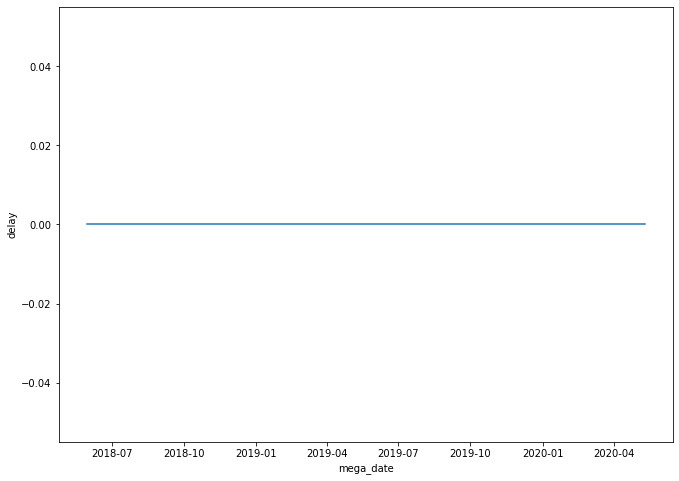

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(11,8))
sns.lineplot(x='mega_date',y='delay',data=tmp1)

In [ ]:
tmp.index.name = 'Date'

In [ ]:
tmp.head()

,mega_date,delay
Date,,
2018-05-30,0,0
2018-05-31,0,0
2018-06-01,0,0
2018-06-02,0,0
2018-06-03,0,0


In [ ]:
fig = px.line(tmp, x=tmp.index, y='delay')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_file
source = ColumnDataSource(tmp)

p = figure(x_axis_type="datetime", plot_width=800, plot_height=350)
p.line('mega_date', 'avg_delay', source=source)

output_file("ts.html")
show(p)